In [1]:
import os
import csv
import time
import pickle
import numpy as np
import pandas as pd
from source import SAX
from source import oneD_SAX
from source.ABBA import ABBA
from source.jabba import fastQABBA
from fABBA import fABBA
from tqdm import tqdm
import matplotlib.pyplot as plt
from source.figdefault import figdefault
from tslearn.metrics import dtw as dtw
from fABBA import inverse_compress
from fABBA import inverse_digitize
from source.jabba.qabba import compute_storage
import warnings
warnings.filterwarnings("ignore")

In [2]:
class Error(Exception):
    """Base class for other exceptions"""
    pass

class TimeSeriesTooShort(Error):
    """Raised when time series is too short"""
    pass

class NotEnoughPieces(Error):
    """Raised when not enough pieces"""
    pass

class CompressionTolHigh(Error):
    """Raised when not enough pieces"""
    pass

class VariantsError(Error):
    """Raised when not enough unique pieces"""
    # Making assumption Ckmeans is available and suitable tol and scl is given.
    pass

class UnknownError(Error):
    """Raised when not enough unique pieces"""
    # Making assumption Ckmeans is available and suitable tol and scl is given.
    pass

class ABBAError(Error):
   # Error arising from ABBA.
    pass

class fABBAError(Error):
    # Error arising from fABBA
    pass


class QABBA1Error(Error):
    # Error arising from QABBA
    pass

class QABBA2Error(Error):
    # Error arising from QABBA
    pass

datadir = 'UCR2018/'
# tolerances
tol = [0.05*i for i in range(1,11)]

# If pickle file does not exist, make it.
# if not os.path.exists('scl'+str(scl)+'.pkl'):

# Calculate number of time series, to provide progess information.
ts_count = 0
for root, dirs, files in os.walk(datadir):
    for file in files:
        if file.endswith('tsv'):
            with open(os.path.join(root, file)) as f:
                content = f.readlines()
                ts_count += len(content)
print('Number of time series:', ts_count)


# Construct list of NaNs
D_SAX_2 = ts_count*[np.NaN]
D_oneD_SAX_2 = ts_count*[np.NaN]
D_ABBA1_2 = ts_count*[np.NaN]
D_fABBA_2 = ts_count*[np.NaN]
D_QABBA1_2 = ts_count*[np.NaN]
D_QABBA2_2 = ts_count*[np.NaN]

D_SAX_DTW = ts_count*[np.NaN]
D_oneD_SAX_DTW = ts_count*[np.NaN]
D_ABBA1_DTW = ts_count*[np.NaN]
D_fABBA_DTW = ts_count*[np.NaN]
D_QABBA1_DTW = ts_count*[np.NaN]
D_QABBA2_DTW = ts_count*[np.NaN]

D_SAX_2_diff = ts_count*[np.NaN]
D_oneD_SAX_2_diff = ts_count*[np.NaN]
D_ABBA1_2_diff = ts_count*[np.NaN]
D_fABBA_2_diff = ts_count*[np.NaN]
D_QABBA1_2_diff = ts_count*[np.NaN]
D_QABBA2_2_diff = ts_count*[np.NaN]

D_SAX_DTW_diff = ts_count*[np.NaN]
D_oneD_SAX_DTW_diff = ts_count*[np.NaN]
D_ABBA1_DTW_diff = ts_count*[np.NaN]
D_fABBA_DTW_diff = ts_count*[np.NaN]
D_QABBA1_DTW_diff = ts_count*[np.NaN]
D_QABBA2_DTW_diff = ts_count*[np.NaN]

D_SAX_time = ts_count*[np.NaN]
D_oneD_SAX_time = ts_count*[np.NaN]
D_ABBA1_time = ts_count*[np.NaN]
D_fABBA_time = ts_count*[np.NaN]
D_QABBA1_time = ts_count*[np.NaN]
D_QABBA2_time = ts_count*[np.NaN]

ts_name = ts_count*[''] # time series name for debugging
count = ts_count*[0]
compression = ts_count*[np.NaN] # Store amount of compression
tol_used = ts_count*[np.NaN] # Store tol used
error = ts_count*[0] # track errors

csymbolicNum = list()
cpiecesNum = list()
ctsname = list()
ctolist = list()


Number of time series: 201761


file: DodgerLoopWeekend_TRAIN.tsv


20it [00:14,  1.36it/s]


file: DodgerLoopWeekend_TEST.tsv


138it [02:01,  1.14it/s]


file: Wine_TRAIN.tsv


57it [00:42,  1.34it/s]


file: Wine_TEST.tsv


54it [00:44,  1.22it/s]


file: Strawberry_TRAIN.tsv


613it [08:10,  1.25it/s]


file: Strawberry_TEST.tsv


370it [04:55,  1.25it/s]


file: ItalyPowerDemand_TRAIN.tsv


67it [00:00, 2624.28it/s]


file: ItalyPowerDemand_TEST.tsv


1029it [00:00, 1981.54it/s]


file: PLAID_TRAIN.tsv


537it [05:47,  1.55it/s]


file: PLAID_TEST.tsv


537it [05:09,  1.73it/s]


file: BirdChicken_TEST.tsv


20it [00:12,  1.60it/s]


file: BirdChicken_TRAIN.tsv


20it [00:16,  1.23it/s]


file: ProximalPhalanxTW_TEST.tsv


205it [00:00, 1114.79it/s]


file: ProximalPhalanxTW_TRAIN.tsv


400it [00:00, 985.73it/s] 


file: Symbols_TRAIN.tsv


25it [00:20,  1.22it/s]


file: Symbols_TEST.tsv


995it [13:29,  1.23it/s]


file: FiftyWords_TRAIN.tsv


450it [06:01,  1.25it/s]


file: FiftyWords_TEST.tsv


455it [06:29,  1.17it/s]


file: ChlorineConcentration_TEST.tsv


3840it [27:57,  2.29it/s]


file: ChlorineConcentration_TRAIN.tsv


467it [03:08,  2.48it/s]


file: Lightning2_TRAIN.tsv


60it [00:52,  1.13it/s]


file: Lightning2_TEST.tsv


61it [00:56,  1.07it/s]


file: UWaveGestureLibraryX_TEST.tsv


3582it [48:41,  1.23it/s]


file: UWaveGestureLibraryX_TRAIN.tsv


896it [13:43,  1.09it/s]


file: FacesUCR_TRAIN.tsv


200it [02:46,  1.20it/s]


file: FacesUCR_TEST.tsv


2050it [26:59,  1.27it/s]


file: Plane_TEST.tsv


105it [01:19,  1.32it/s]


file: Plane_TRAIN.tsv


105it [01:22,  1.27it/s]


file: RefrigerationDevices_TRAIN.tsv


375it [07:56,  1.27s/it]


file: RefrigerationDevices_TEST.tsv


375it [06:00,  1.04it/s]


file: DodgerLoopWeekend_TRAIN.tsv


20it [00:11,  1.74it/s]


file: DodgerLoopWeekend_TEST.tsv


138it [01:22,  1.67it/s]


file: PLAID_TRAIN.tsv


537it [08:47,  1.02it/s]


file: PLAID_TEST.tsv


537it [06:17,  1.42it/s]


file: AllGestureWiimoteZ_TRAIN.tsv


300it [01:51,  2.68it/s]


file: AllGestureWiimoteZ_TEST.tsv


700it [04:01,  2.90it/s]


file: ShakeGestureWiimoteZ_TEST.tsv


50it [00:21,  2.37it/s]


file: ShakeGestureWiimoteZ_TRAIN.tsv


50it [00:18,  2.66it/s]


file: AllGestureWiimoteX_TEST.tsv


700it [06:05,  1.91it/s]


file: AllGestureWiimoteX_TRAIN.tsv


300it [04:16,  1.17it/s]


file: MelbournePedestrian_TRAIN.tsv


1194it [00:00, 3776.34it/s]


file: MelbournePedestrian_TEST.tsv


2439it [00:01, 2333.89it/s]


file: GestureMidAirD3_TRAIN.tsv


208it [02:29,  1.39it/s]


file: GestureMidAirD3_TEST.tsv


130it [01:34,  1.37it/s]


file: GesturePebbleZ2_TRAIN.tsv


146it [01:55,  1.26it/s]


file: GesturePebbleZ2_TEST.tsv


158it [02:10,  1.22it/s]


file: GestureMidAirD1_TRAIN.tsv


208it [02:28,  1.40it/s]


file: GestureMidAirD1_TEST.tsv


130it [01:29,  1.45it/s]


file: AllGestureWiimoteY_TEST.tsv


700it [09:17,  1.26it/s]


file: AllGestureWiimoteY_TRAIN.tsv


300it [03:55,  1.27it/s]


file: PickupGestureWiimoteZ_TEST.tsv


50it [00:38,  1.31it/s]


file: PickupGestureWiimoteZ_TRAIN.tsv


50it [00:39,  1.25it/s]


file: DodgerLoopGame_TEST.tsv


138it [01:56,  1.19it/s]


file: DodgerLoopGame_TRAIN.tsv


20it [00:21,  1.05s/it]


file: DodgerLoopDay_TEST.tsv


80it [01:19,  1.00it/s]


file: DodgerLoopDay_TRAIN.tsv


78it [01:12,  1.07it/s]


file: GestureMidAirD2_TEST.tsv


130it [01:35,  1.36it/s]


file: GestureMidAirD2_TRAIN.tsv


208it [02:30,  1.38it/s]


file: GesturePebbleZ1_TRAIN.tsv


132it [01:47,  1.23it/s]


file: GesturePebbleZ1_TEST.tsv


172it [02:37,  1.09it/s]


file: ProximalPhalanxOutlineAgeGroup_TEST.tsv


205it [00:00, 2015.99it/s]


file: ProximalPhalanxOutlineAgeGroup_TRAIN.tsv


400it [00:00, 1274.26it/s]


file: FordB_TEST.tsv


810it [13:51,  1.03s/it]


file: FordB_TRAIN.tsv


3636it [56:33,  1.07it/s]


file: Mallat_TRAIN.tsv


55it [00:57,  1.05s/it]


file: Mallat_TEST.tsv


2345it [36:00,  1.09it/s]


file: SemgHandMovementCh2_TRAIN.tsv


450it [04:27,  1.69it/s]


file: SemgHandMovementCh2_TEST.tsv


450it [04:19,  1.73it/s]


file: Phoneme_TEST.tsv


1896it [18:02,  1.75it/s]


file: Phoneme_TRAIN.tsv


214it [02:50,  1.25it/s]


file: UWaveGestureLibraryAll_TEST.tsv


3582it [42:27,  1.41it/s]


file: UWaveGestureLibraryAll_TRAIN.tsv


896it [14:14,  1.05it/s]


file: Chinatown_TRAIN.tsv


20it [00:00, 12289.20it/s]


file: Chinatown_TEST.tsv


343it [00:00, 13129.09it/s]


file: LargeKitchenAppliances_TEST.tsv


375it [05:36,  1.11it/s]


file: LargeKitchenAppliances_TRAIN.tsv


375it [05:29,  1.14it/s]


file: Wafer_TRAIN.tsv


1000it [09:11,  1.81it/s]


file: Wafer_TEST.tsv


6164it [53:23,  1.92it/s]


file: AllGestureWiimoteZ_TRAIN.tsv


300it [01:32,  3.25it/s]


file: AllGestureWiimoteZ_TEST.tsv


700it [03:35,  3.24it/s]


file: HouseTwenty_TRAIN.tsv


40it [01:42,  2.56s/it]


file: HouseTwenty_TEST.tsv


119it [05:19,  2.69s/it]


file: ECGFiveDays_TRAIN.tsv


23it [00:10,  2.13it/s]


file: ECGFiveDays_TEST.tsv


861it [07:03,  2.03it/s]


file: Worms_TRAIN.tsv


181it [03:01,  1.00s/it]


file: Worms_TEST.tsv


77it [01:18,  1.02s/it]


file: BeetleFly_TRAIN.tsv


20it [00:17,  1.13it/s]


file: BeetleFly_TEST.tsv


20it [00:17,  1.17it/s]


file: ECG200_TRAIN.tsv


100it [00:00, 4605.94it/s]


file: ECG200_TEST.tsv


100it [00:00, 1261.86it/s]


file: ECG200_TRAIN-checkpoint.tsv


100it [00:00, 3281.52it/s]


file: CinCECGTorso_TEST.tsv


1380it [1:06:47,  2.90s/it]


file: CinCECGTorso_TRAIN.tsv


40it [02:04,  3.10s/it]


file: MoteStrain_TRAIN.tsv


20it [00:00, 7993.72it/s]


file: MoteStrain_TEST.tsv


1252it [00:00, 1675.50it/s]


file: MiddlePhalanxOutlineCorrect_TEST.tsv


291it [00:00, 7469.89it/s]


file: MiddlePhalanxOutlineCorrect_TRAIN.tsv


600it [00:00, 1981.31it/s]


file: InsectEPGSmallTrain_TEST.tsv


249it [03:09,  1.31it/s]


file: InsectEPGSmallTrain_TRAIN.tsv


17it [00:14,  1.17it/s]


file: ShakeGestureWiimoteZ_TEST.tsv


50it [00:22,  2.17it/s]


file: ShakeGestureWiimoteZ_TRAIN.tsv


50it [00:20,  2.49it/s]


file: SmallKitchenAppliances_TEST.tsv


375it [04:25,  1.41it/s]


file: SmallKitchenAppliances_TRAIN.tsv


375it [03:36,  1.74it/s]


file: MixedShapesSmallTrain_TEST.tsv


2425it [29:31,  1.37it/s]


file: MixedShapesSmallTrain_TRAIN.tsv


100it [01:05,  1.53it/s]


file: ACSF1_TEST.tsv


100it [01:10,  1.41it/s]


file: ACSF1_TRAIN.tsv


100it [01:28,  1.13it/s]


file: Trace_TEST.tsv


100it [00:56,  1.77it/s]


file: Trace_TRAIN.tsv


100it [00:54,  1.85it/s]


file: SyntheticControl_TRAIN.tsv


300it [00:00, 2938.77it/s]


file: SyntheticControl_TEST.tsv


300it [00:00, 1638.33it/s]


file: CBF_TRAIN.tsv


30it [00:14,  2.08it/s]


file: CBF_TEST.tsv


900it [07:00,  2.14it/s]


file: MedicalImages_TEST.tsv


760it [00:00, 1245.10it/s]


file: MedicalImages_TRAIN.tsv


381it [00:00, 2036.16it/s]


file: ElectricDevices_TEST.tsv


7711it [00:03, 2050.58it/s]


file: ElectricDevices_TRAIN.tsv


8926it [00:03, 2678.65it/s]


file: AllGestureWiimoteX_TEST.tsv


700it [03:41,  3.17it/s]


file: AllGestureWiimoteX_TRAIN.tsv


300it [01:25,  3.50it/s]


file: Lightning7_TRAIN.tsv


70it [00:40,  1.75it/s]


file: Lightning7_TEST.tsv


73it [00:42,  1.72it/s]


file: GunPoint_TRAIN.tsv


50it [00:20,  2.40it/s]


file: GunPoint_TEST.tsv


150it [00:51,  2.89it/s]


file: Fungi_TRAIN.tsv


18it [00:07,  2.31it/s]


file: Fungi_TEST.tsv


186it [01:23,  2.24it/s]


file: WordSynonyms_TRAIN.tsv


267it [02:08,  2.07it/s]


file: WordSynonyms_TEST.tsv


638it [04:52,  2.18it/s]


file: CricketX_TEST.tsv


390it [03:27,  1.88it/s]


file: CricketX_TRAIN.tsv


390it [03:17,  1.97it/s]


file: ArrowHead_TEST.tsv


175it [01:14,  2.36it/s]


file: ArrowHead_TRAIN.tsv


36it [00:15,  2.25it/s]


file: TwoLeadECG_TEST.tsv


1139it [00:00, 2741.14it/s]


file: TwoLeadECG_TRAIN.tsv


23it [00:00, 7412.71it/s]


file: FaceFour_TRAIN.tsv


24it [00:16,  1.47it/s]


file: FaceFour_TEST.tsv


88it [00:47,  1.85it/s]


file: FreezerRegularTrain_TRAIN.tsv


150it [01:04,  2.31it/s]


file: FreezerRegularTrain_TEST.tsv


2850it [20:55,  2.27it/s]


file: Ham_TEST.tsv


105it [00:57,  1.83it/s]


file: Ham_TRAIN.tsv


109it [01:01,  1.77it/s]


file: ScreenType_TEST.tsv


375it [04:05,  1.53it/s]


file: ScreenType_TRAIN.tsv


375it [04:01,  1.55it/s]


file: MelbournePedestrian_TRAIN.tsv


1194it [00:00, 15682.39it/s]


file: MelbournePedestrian_TEST.tsv


2439it [00:00, 7564.08it/s]


file: UWaveGestureLibraryZ_TEST.tsv


3582it [23:21,  2.56it/s]


file: UWaveGestureLibraryZ_TRAIN.tsv


896it [11:03,  1.35it/s]


file: InsectWingbeatSound_TEST.tsv


1980it [29:16,  1.13it/s]


file: InsectWingbeatSound_TRAIN.tsv


220it [03:27,  1.06it/s]


file: FreezerSmallTrain_TRAIN.tsv


28it [00:23,  1.19it/s]


file: FreezerSmallTrain_TEST.tsv


2850it [36:27,  1.30it/s]


file: Beef_TEST.tsv


30it [00:30,  1.01s/it]


file: Beef_TRAIN.tsv


30it [00:28,  1.03it/s]


file: NonInvasiveFetalECGThorax1_TEST.tsv


1965it [32:17,  1.01it/s]


file: NonInvasiveFetalECGThorax1_TRAIN.tsv


1800it [39:21,  1.31s/it]


file: Haptics_TEST.tsv


308it [09:38,  1.88s/it]


file: Haptics_TRAIN.tsv


155it [04:23,  1.70s/it]


file: SwedishLeaf_TRAIN.tsv


500it [06:49,  1.22it/s]


file: SwedishLeaf_TEST.tsv


625it [09:46,  1.07it/s]


file: GestureMidAirD3_TRAIN.tsv


208it [02:52,  1.21it/s]


file: GestureMidAirD3_TEST.tsv


130it [01:51,  1.17it/s]


file: GunPointAgeSpan_TEST.tsv


316it [05:07,  1.03it/s]


file: GunPointAgeSpan_TRAIN.tsv


135it [02:09,  1.04it/s]


file: Computers_TRAIN.tsv


250it [05:55,  1.42s/it]


file: Computers_TEST.tsv


250it [06:07,  1.47s/it]


file: MiddlePhalanxTW_TEST.tsv


154it [00:00, 854.73it/s] 


file: MiddlePhalanxTW_TRAIN.tsv


399it [00:00, 1270.73it/s]


file: HandOutlines_TEST.tsv


370it [24:34,  3.99s/it]


file: HandOutlines_TRAIN.tsv


1000it [43:17,  2.60s/it]


file: DistalPhalanxTW_TRAIN.tsv


400it [00:00, 10290.62it/s]


file: DistalPhalanxTW_TEST.tsv


139it [00:00, 9939.79it/s]


file: Rock_TEST.tsv


50it [00:57,  1.16s/it]


file: Rock_TRAIN.tsv


20it [00:23,  1.17s/it]


file: GesturePebbleZ2_TRAIN.tsv


146it [00:29,  4.93it/s]


file: GesturePebbleZ2_TEST.tsv


158it [00:33,  4.70it/s]


file: InsectEPGRegularTrain_TRAIN.tsv


62it [00:14,  4.18it/s]


file: InsectEPGRegularTrain_TEST.tsv


249it [00:56,  4.37it/s]


file: Earthquakes_TEST.tsv


139it [00:10, 12.64it/s]


file: Earthquakes_TRAIN.tsv


322it [00:27, 11.82it/s]


file: ToeSegmentation2_TRAIN.tsv


36it [00:08,  4.26it/s]


file: ToeSegmentation2_TEST.tsv


130it [00:27,  4.68it/s]


file: GestureMidAirD1_TRAIN.tsv


208it [00:59,  3.47it/s]


file: GestureMidAirD1_TEST.tsv


130it [00:44,  2.92it/s]


file: AllGestureWiimoteY_TEST.tsv


700it [02:56,  3.96it/s]


file: AllGestureWiimoteY_TRAIN.tsv


300it [01:17,  3.85it/s]


file: ECG5000_TRAIN.tsv


500it [03:32,  2.36it/s]


file: ECG5000_TEST.tsv


4500it [31:15,  2.40it/s]


file: ECG5000_TRAIN-checkpoint.tsv


500it [03:27,  2.41it/s]


file: SemgHandSubjectCh2_TRAIN.tsv


450it [03:06,  2.42it/s]


file: SemgHandSubjectCh2_TEST.tsv


450it [02:55,  2.56it/s]


file: FordA_TEST.tsv


1320it [16:35,  1.33it/s]


file: FordA_TRAIN.tsv


3601it [1:38:05,  1.63s/it]


file: Yoga_TRAIN.tsv


300it [05:02,  1.01s/it]


file: Yoga_TEST.tsv


3000it [20:51,  2.40it/s]


file: PigAirwayPressure_TRAIN.tsv


104it [03:53,  2.24s/it]


file: PigAirwayPressure_TEST.tsv


208it [07:44,  2.24s/it]


file: SonyAIBORobotSurface1_TEST.tsv


601it [00:00, 2558.12it/s]


file: SonyAIBORobotSurface1_TRAIN.tsv


20it [00:00, 5424.60it/s]


file: FaceAll_TEST.tsv


1690it [20:28,  1.38it/s]


file: FaceAll_TRAIN.tsv


560it [07:37,  1.22it/s]


file: DiatomSizeReduction_TRAIN.tsv


16it [00:12,  1.29it/s]


file: DiatomSizeReduction_TEST.tsv


306it [05:31,  1.08s/it]


file: PickupGestureWiimoteZ_TEST.tsv


50it [00:29,  1.69it/s]


file: PickupGestureWiimoteZ_TRAIN.tsv


50it [00:22,  2.25it/s]


file: ShapesAll_TRAIN.tsv


600it [11:42,  1.17s/it]


file: ShapesAll_TEST.tsv


600it [13:15,  1.33s/it]


file: ProximalPhalanxOutlineCorrect_TRAIN.tsv


600it [00:00, 1522.26it/s]


file: ProximalPhalanxOutlineCorrect_TEST.tsv


291it [00:00, 1491.57it/s]


file: ShapeletSim_TEST.tsv


180it [01:42,  1.76it/s]


file: ShapeletSim_TRAIN.tsv


20it [00:16,  1.19it/s]


file: SemgHandGenderCh2_TEST.tsv


600it [09:15,  1.08it/s]


file: SemgHandGenderCh2_TRAIN.tsv


300it [04:49,  1.04it/s]


file: DodgerLoopGame_TEST.tsv


138it [01:46,  1.29it/s]


file: DodgerLoopGame_TRAIN.tsv


20it [00:15,  1.29it/s]


file: OliveOil_TEST.tsv


30it [00:24,  1.21it/s]


file: OliveOil_TRAIN.tsv


30it [00:25,  1.16it/s]


file: EOGHorizontalSignal_TRAIN.tsv


362it [09:44,  1.61s/it]


file: EOGHorizontalSignal_TEST.tsv


362it [14:49,  2.46s/it]


file: Adiac_TRAIN.tsv


390it [05:40,  1.14it/s]


file: Adiac_TEST.tsv


391it [07:23,  1.13s/it]


file: WormsTwoClass_TRAIN.tsv


181it [06:29,  2.15s/it]


file: WormsTwoClass_TEST.tsv


77it [03:07,  2.43s/it]


file: UWaveGestureLibraryY_TRAIN.tsv


896it [17:53,  1.20s/it]


file: UWaveGestureLibraryY_TEST.tsv


3582it [45:19,  1.32it/s]


file: MiddlePhalanxOutlineAgeGroup_TEST.tsv


154it [00:00, 828.26it/s]


file: MiddlePhalanxOutlineAgeGroup_TRAIN.tsv


400it [00:00, 1268.92it/s]


file: EOGVerticalSignal_TRAIN.tsv


362it [07:25,  1.23s/it]


file: EOGVerticalSignal_TEST.tsv


362it [02:53,  2.08it/s]


file: DistalPhalanxOutlineCorrect_TEST.tsv


276it [00:00, 11379.08it/s]


file: DistalPhalanxOutlineCorrect_TRAIN.tsv


600it [00:00, 11504.74it/s]


file: DodgerLoopDay_TEST.tsv


80it [00:15,  5.15it/s]


file: DodgerLoopDay_TRAIN.tsv


78it [00:14,  5.28it/s]


file: ToeSegmentation1_TRAIN.tsv


40it [00:08,  4.49it/s]


file: ToeSegmentation1_TEST.tsv


228it [00:45,  5.00it/s]


file: PigCVP_TRAIN.tsv


104it [01:22,  1.26it/s]


file: PigCVP_TEST.tsv


208it [03:41,  1.06s/it]


file: SmoothSubspace_TEST.tsv


150it [00:00, 16883.02it/s]


file: SmoothSubspace_TRAIN.tsv


150it [00:00, 16674.94it/s]


file: NonInvasiveFetalECGThorax2_TRAIN.tsv


1800it [14:01,  2.14it/s]


file: NonInvasiveFetalECGThorax2_TEST.tsv


1965it [31:45,  1.03it/s]


file: GunPointMaleVersusFemale_TRAIN.tsv


135it [00:30,  4.37it/s]


file: GunPointMaleVersusFemale_TEST.tsv


316it [01:12,  4.34it/s]


file: OSULeaf_TRAIN.tsv


200it [01:01,  3.23it/s]


file: OSULeaf_TEST.tsv


242it [01:09,  3.51it/s]


file: UMD_TEST.tsv


144it [00:34,  4.14it/s]


file: UMD_TRAIN.tsv


36it [00:08,  4.18it/s]


file: GestureMidAirD2_TEST.tsv


130it [00:26,  4.95it/s]


file: GestureMidAirD2_TRAIN.tsv


208it [00:39,  5.29it/s]


file: MixedShapesRegularTrain_TEST.tsv


2425it [17:48,  2.27it/s]


file: MixedShapesRegularTrain_TRAIN.tsv


500it [05:18,  1.57it/s]


file: DistalPhalanxOutlineAgeGroup_TRAIN.tsv


400it [00:00, 8895.00it/s]


file: DistalPhalanxOutlineAgeGroup_TEST.tsv


139it [00:00, 6573.18it/s]


file: PhalangesOutlinesCorrect_TRAIN.tsv


1800it [00:00, 4574.45it/s]


file: PhalangesOutlinesCorrect_TEST.tsv


858it [00:00, 4556.21it/s]


file: StarLightCurves_TRAIN.tsv


1000it [10:20,  1.61it/s]


file: StarLightCurves_TEST.tsv


8236it [1:44:15,  1.32it/s]


file: PowerCons_TRAIN.tsv


180it [01:47,  1.67it/s]


file: PowerCons_TEST.tsv


180it [01:56,  1.55it/s]


file: Crop_TRAIN.tsv


7200it [00:01, 6342.22it/s]


file: Crop_TEST.tsv


16800it [00:03, 4738.41it/s]


file: GesturePebbleZ1_TRAIN.tsv


132it [01:26,  1.52it/s]


file: GesturePebbleZ1_TEST.tsv


172it [01:49,  1.57it/s]


file: InlineSkate_TEST.tsv


550it [15:00,  1.64s/it]


file: InlineSkate_TRAIN.tsv


100it [02:40,  1.61s/it]


file: CricketZ_TEST.tsv


390it [04:30,  1.44it/s]


file: CricketZ_TRAIN.tsv


390it [04:24,  1.48it/s]


file: SonyAIBORobotSurface2_TRAIN.tsv


27it [00:00, 5026.02it/s]


file: SonyAIBORobotSurface2_TEST.tsv


953it [00:00, 5705.84it/s]


file: Car_TEST.tsv


60it [00:43,  1.39it/s]


file: Car_TRAIN.tsv


60it [00:43,  1.38it/s]


file: CricketY_TEST.tsv


390it [04:29,  1.45it/s]


file: CricketY_TRAIN.tsv


390it [04:17,  1.51it/s]


file: Meat_TRAIN.tsv


60it [00:36,  1.63it/s]


file: Meat_TEST.tsv


60it [00:37,  1.61it/s]


file: EthanolLevel_TEST.tsv


500it [12:35,  1.51s/it]


file: EthanolLevel_TRAIN.tsv


504it [13:35,  1.62s/it]


file: TwoPatterns_TEST.tsv


4000it [33:20,  2.00it/s]


file: TwoPatterns_TRAIN.tsv


1000it [09:07,  1.83it/s]


file: Fish_TRAIN.tsv


175it [02:42,  1.07it/s]


file: Fish_TEST.tsv


175it [02:41,  1.08it/s]


file: Herring_TRAIN.tsv


64it [01:01,  1.04it/s]


file: Herring_TEST.tsv


64it [01:04,  1.00s/it]


file: BME_TEST.tsv


150it [01:57,  1.27it/s]


file: BME_TRAIN.tsv


30it [00:24,  1.20it/s]


file: Coffee_TRAIN.tsv


28it [00:26,  1.07it/s]


file: Coffee_TEST.tsv


28it [00:25,  1.09it/s]


file: PigArtPressure_TEST.tsv


208it [09:29,  2.74s/it]


file: PigArtPressure_TRAIN.tsv


104it [02:15,  1.30s/it]


file: GunPointOldVersusYoung_TRAIN.tsv


136it [00:53,  2.52it/s]


file: GunPointOldVersusYoung_TEST.tsv


315it [02:08,  2.45it/s]


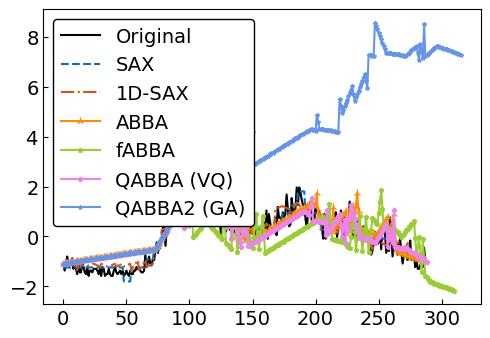

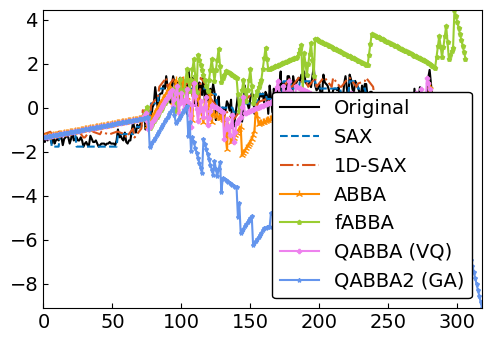

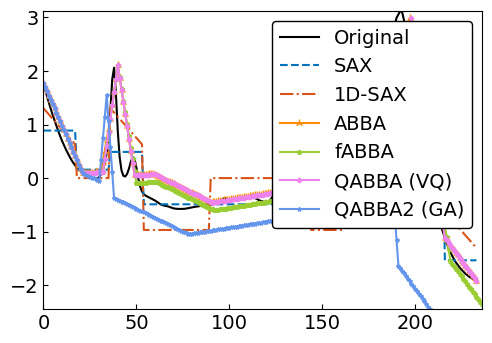

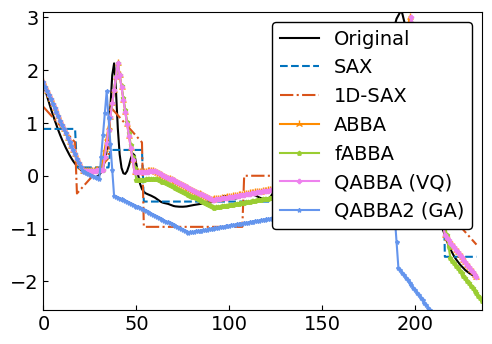

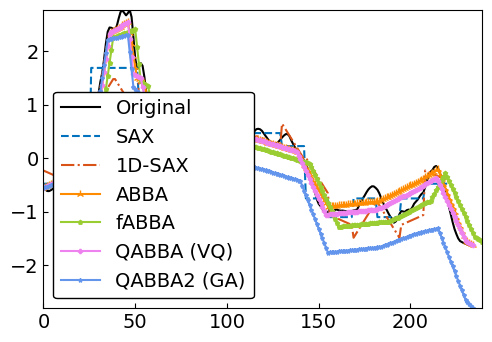

...

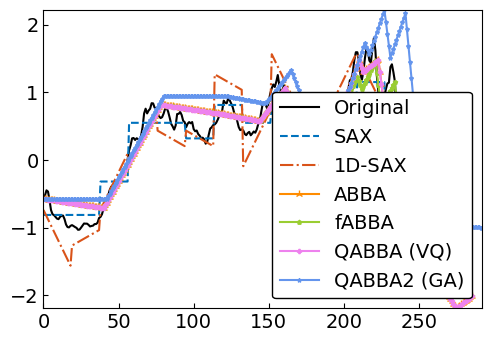

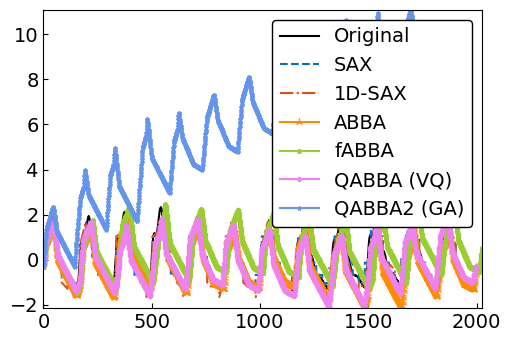

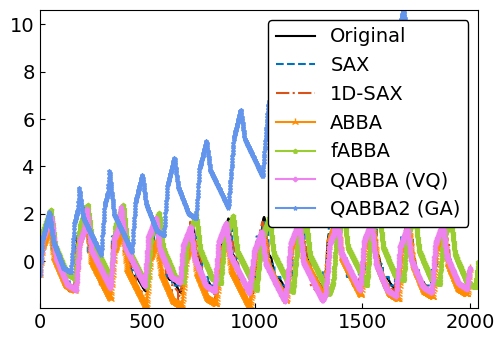

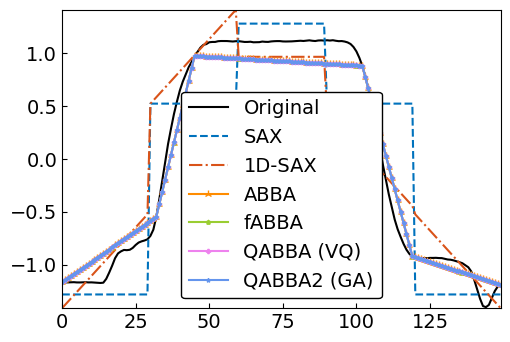

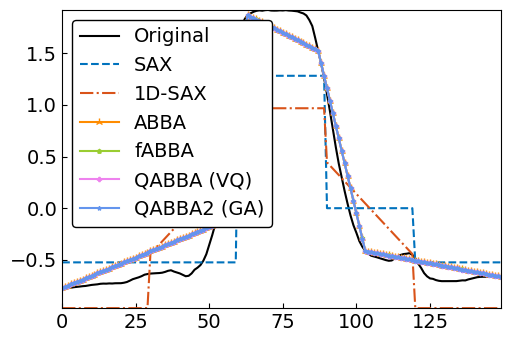

In [3]:

# Run through time series
index = 0
for root, dirs, files in os.walk(datadir):
    for file in files:
        if file.endswith('tsv'):
            print('file:', file)

            # bool to keep track of plots, one plot per classification.
            need_to_plot = True

            with open(os.path.join(root, file)) as tsvfile:
                tsvfile = csv.reader(tsvfile, delimiter='\t')

                for ind, column in tqdm(enumerate(tsvfile)):
                    ts_name[index] += str(file) + '_' + str(ind) # Save filename + index

                    ts = [float(i) for i in column] # convert to list of floats
                    ts = np.array(ts[1:]) # remove class information

                    # remove NaN from time series
                    ts = ts[~np.isnan(ts)]

                    # Z Normalise the times series
                    norm_ts = (ts -  np.mean(ts))
                    std = np.std(norm_ts, ddof=1)
                    std = std if std > np.finfo(float).eps else 1
                    norm_ts /= std
                    
                    try:
                        # Check length of time timeseries
                        if len(norm_ts) < 100:
                            raise(TimeSeriesTooShort)

                        # Reset tolerance
                        tol_index = 0

                        # ABBA (Adjust tolerance so at least 20% compression is used)
                        for tol_index in range(len(tol)):
                            abba = ABBA(tol=tol[tol_index], verbose=0)
                            pieces = abba.compress(norm_ts)
                            ABBA_len = len(pieces)
                            if ABBA_len <= len(norm_ts)/5:
                                tol_used[index] = tol[tol_index]
                                break
                            elif tol_index == len(tol)-1:
                                raise(CompressionTolHigh)
                        
                        try:
                            fabba = fABBA(verbose=0, alpha=0.5, scl=1, sorting='2-norm') 
                            st = time.time()
                            symbols_fabba, parameters_fabba = fabba.digitize(pieces[:,:2])
                            ed = time.time()
                            time_fabba = ed - st
                        except:
                            raise(fABBAError)
                            
                        try:
                            symbolnum = len(set(symbols_fabba))
                            abba1 = ABBA(scl=1, verbose=0, min_k=symbolnum, max_k=symbolnum)

                            st = time.time()
                            symbolic_ts1, centers1 = abba1.digitize(pieces)
                            ed = time.time()
                            time_abba1 = ed - st
                        except:
                            raise(ABBAError)
                            
                        try:
                            symbolnum = len(set(symbols_fabba))
                            qabba1 = fastQABBA(tol=0.1, init='kmeans', k=symbolnum, verbose=0, bits_for_len=8, bits_for_inc=12)
                            
                            st = time.time()
                            symbols_qabba1 = qabba1._digitize(pieces[:,:2])
                            ed = time.time()
                            time_qabba1 = ed - st
                        except:
                            raise(QABBA1Error)
                         
                        
                        try:
                            symbolnum = len(set(symbols_fabba))
                            qabba2 = fastQABBA(tol=0.1, init='agg', sorting='2-norm', alpha=0.5, verbose=0, bits_for_len=8, bits_for_inc=12)
                            
                            st = time.time()
                            symbols_qabba2 = qabba2._digitize(pieces[:,:2])
                            ed = time.time()
                            time_qabba2 = ed - st
                        except:
                            raise(QABBA2Error)
                            
                        csymbolicNum.append(symbolnum)
                        cpiecesNum.append(len(pieces))
                        ctsname.append(str(file) + '_' + str(ind))
                        ctolist.append(tol[tol_index])
                        
                        ts_ABBA1 = abba1.inverse_transform(symbolic_ts1, centers1, norm_ts[0])
                        ts_fABBA = inverse_compress(inverse_digitize(symbols_fabba, parameters_fabba), norm_ts[0])
                        ts_QABBA1 = qabba1.inverse_transform(symbols_qabba1, norm_ts[0])
                        ts_QABBA2 = qabba2.inverse_transform(symbols_qabba2, norm_ts[0])

                        # SAX
                        width = len(norm_ts) // ABBA_len # crop to equal number of segments as ABBA.
                        reduced_ts = SAX.compress(norm_ts[0:width*ABBA_len], width = width)
                        st = time.time()
                        symbolic_ts = SAX.digitize(reduced_ts, number_of_symbols = symbolnum)
                        ed = time.time()
                        SAX_len = len(symbolic_ts)
                        reduced_ts = SAX.reverse_digitize(symbolic_ts, number_of_symbols = symbolnum)
                        ts_SAX = SAX.reconstruct(reduced_ts, width = width)
                        time_sax = ed - st
                        
                        # oneD_SAX
                        width = max(len(norm_ts) // ABBA_len, 2) # crop to equal number of segments as ABBA.
                        slope = int(np.ceil(np.sqrt(symbolnum)))
                        intercept = int(np.ceil(np.sqrt(symbolnum)))
                        reduced_ts = oneD_SAX.compress(norm_ts[0:width*ABBA_len], width = width)
                        st = time.time()
                        symbolic_ts = oneD_SAX.digitize(reduced_ts, width, slope, intercept)
                        ed = time.time()
                        oneD_SAX_len = len(symbolic_ts)
                        reduced_ts = oneD_SAX.reverse_digitize(symbolic_ts, width, slope, intercept)
                        ts_oneD_SAX = oneD_SAX.reconstruct(reduced_ts, width = width)
                        time_oneD_sax = ed - st

                        # Compute distances
                        minlen1 = min(len(ts_SAX), len(norm_ts))
                        minlen2 = min(len(ts_oneD_SAX), len(norm_ts))
                        minlen3 = min(len(ts_ABBA1), len(norm_ts))
                        minlen4 = min(len(ts_fABBA), len(norm_ts))
                        minlen5 = min(len(ts_QABBA1), len(norm_ts))
                        minlen6 = min(len(ts_QABBA2), len(norm_ts))
                        
                        D_SAX_2[index]      = np.linalg.norm(norm_ts[:minlen1] - ts_SAX[:minlen1])
                        D_oneD_SAX_2[index] = np.linalg.norm(norm_ts[:minlen2] - ts_oneD_SAX[:minlen2])
                        D_ABBA1_2[index]    = np.linalg.norm(norm_ts[:minlen3] - ts_ABBA1[:minlen3])
                        D_fABBA_2[index]    = np.linalg.norm(norm_ts[:minlen4] - ts_fABBA[:minlen4])
                        D_QABBA1_2[index]    = np.linalg.norm(norm_ts[:minlen5] - ts_QABBA1[:minlen5])
                        D_QABBA2_2[index]    = np.linalg.norm(norm_ts[:minlen6] - ts_QABBA2[:minlen6])
                        
                        D_SAX_DTW[index]      = dtw(norm_ts[:minlen1], ts_SAX[:minlen1])
                        D_oneD_SAX_DTW[index] = dtw(norm_ts[:minlen2], ts_oneD_SAX[:minlen2])
                        D_ABBA1_DTW[index]    = dtw(norm_ts[:minlen3], ts_ABBA1[:minlen3])
                        D_fABBA_DTW[index]    = dtw(norm_ts[:minlen4], ts_fABBA[:minlen4])
                        D_QABBA1_DTW[index]    = dtw(norm_ts[:minlen5], ts_QABBA1[:minlen5])
                        D_QABBA2_DTW[index]    = dtw(norm_ts[:minlen6], ts_QABBA2[:minlen6])
                        
                        D_SAX_2_diff[index]       = np.linalg.norm(np.diff(norm_ts[:minlen1]) - np.diff(ts_SAX[:minlen1]))
                        D_oneD_SAX_2_diff[index]  = np.linalg.norm(np.diff(norm_ts[:minlen2]) - np.diff(ts_oneD_SAX[:minlen2]))
                        D_ABBA1_2_diff[index]     = np.linalg.norm(np.diff(norm_ts[:minlen3]) - np.diff(ts_ABBA1[:minlen3]))
                        D_fABBA_2_diff[index]     = np.linalg.norm(np.diff(norm_ts[:minlen4]) - np.diff(ts_fABBA[:minlen4]))
                        D_QABBA1_2_diff[index]     = np.linalg.norm(np.diff(norm_ts[:minlen5]) - np.diff(ts_QABBA1[:minlen5]))
                        D_QABBA2_2_diff[index]     = np.linalg.norm(np.diff(norm_ts[:minlen6]) - np.diff(ts_QABBA2[:minlen6]))
                        
                        D_SAX_DTW_diff[index]      =   dtw(np.diff(norm_ts[:minlen1]), np.diff(ts_SAX[:minlen1]))
                        D_oneD_SAX_DTW_diff[index] =   dtw(np.diff(norm_ts[:minlen2]), np.diff(ts_oneD_SAX[:minlen2]))
                        D_ABBA1_DTW_diff[index]     =  dtw(np.diff(norm_ts[:minlen3]), np.diff(ts_ABBA1[:minlen3]))
                        D_fABBA_DTW_diff[index]     =  dtw(np.diff(norm_ts[:minlen4]), np.diff(ts_fABBA[:minlen4]))
                        D_QABBA1_DTW_diff[index]     =  dtw(np.diff(norm_ts[:minlen5]), np.diff(ts_QABBA1[:minlen5]))
                        D_QABBA2_DTW_diff[index]     =  dtw(np.diff(norm_ts[:minlen6]), np.diff(ts_QABBA2[:minlen6]))
                        
                        # Compute time
                        D_SAX_time[index] = time_sax
                        D_oneD_SAX_time[index] = time_oneD_sax
                        D_ABBA1_time[index] = time_abba1
                        D_fABBA_time[index] = time_fabba
                        D_QABBA1_time[index] = time_qabba1
                        D_QABBA2_time[index] = time_qabba2
                        
                        compression[index] = ABBA_len/len(norm_ts) # Store compression amount
                        count[index] = len(norm_ts)
                        index += 1
                        
                        
                        if need_to_plot:
                            fig, ax = plt.subplots(1, 1)
                            fig, ax = figdefault(fig, ax, r=0.7)
                            plt.plot(norm_ts, c='k', label='Original')
                            plt.plot(ts_SAX, '--',  label='SAX')
                            plt.plot(ts_oneD_SAX, '-.', label='1D-SAX')
                            plt.plot(ts_ABBA1, marker='2', c='darkorange', label='ABBA')
                            plt.plot(ts_fABBA , marker='p', markersize=3, c='yellowgreen', label='fABBA')
                            plt.plot(ts_QABBA1, marker='P', markersize=3, c='violet', label='QABBA (VQ)')
                            plt.plot(ts_QABBA2 , marker='*', markersize=3, c='cornflowerblue', label='QABBA (GA)')
                            plt.legend(fontsize=14, loc='best')
                            plt.grid(False) # axis='y'
                            plt.tick_params(axis='both', labelsize=14)
                            plt.savefig('results/pp'+'/fig0.5/'+file[0:-4]+'.pdf')
                            need_to_plot = False

                    except(TypeError):
                        error[index] = 1
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
                        
                    except(TimeSeriesTooShort):
                        error[index] = 2
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass

                    except(NotEnoughPieces):
                        error[index] = 3
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass

                    except(CompressionTolHigh):
                        error[index] = 4
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass

                    except(UnknownError):
                        error[index] = 5
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
                    
                    except(ValueError):
                        error[index] = 6
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
                    
                    except(ABBAError):
                        error[index] = 7
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
                    
                    except(fABBAError):
                        error[index] = 8
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
                    
                    except(QABBA1Error):
                        error[index] = 9
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
                    
                    except(QABBA2Error):
                        error[index] = 10
                        compression[index] = np.NaN
                        tol_used[index] = np.NaN
                        index += 1
                        pass
D = {}
D['ts_name'] = ts_name
D['compression'] = compression
D['tol_used'] = tol_used
D['error'] = error
D['tol'] = tol

D['SAX_2'] = D_SAX_2
D['oneD_SAX_2'] = D_oneD_SAX_2
D['ABBA_2'] = D_ABBA1_2
D['fABBA_2'] = D_fABBA_2
D['QABBA1_2'] = D_QABBA1_2
D['QABBA2_2'] = D_QABBA2_2

D['SAX_DTW'] = D_SAX_DTW
D['oneD_SAX_DTW'] = D_oneD_SAX_DTW
D['ABBA_DTW'] = D_ABBA1_DTW
D['fABBA_DTW'] = D_fABBA_DTW
D['QABBA1_DTW'] = D_QABBA1_DTW
D['QABBA2_DTW'] = D_QABBA2_DTW

D['SAX_2_diff'] = D_SAX_2_diff
D['oneD_SAX_2_diff'] = D_oneD_SAX_2_diff
D['ABBA_2_diff'] = D_ABBA1_2_diff
D['fABBA_2_diff'] = D_fABBA_2_diff
D['QABBA1_2_diff'] = D_QABBA1_2_diff
D['QABBA2_2_diff'] = D_QABBA2_2_diff

D['SAX_DTW_diff'] = D_SAX_DTW_diff
D['oneD_SAX_DTW_diff'] = D_oneD_SAX_DTW_diff
D['ABBA_DTW_diff'] = D_ABBA1_DTW_diff
D['fABBA_DTW_diff'] = D_fABBA_DTW_diff
D['QABBA1_DTW_diff'] = D_QABBA1_DTW_diff
D['QABBA2_DTW_diff'] = D_QABBA2_DTW_diff

D['SAX_time'] =  D_SAX_time
D['oneD_SAX_time'] = D_oneD_SAX_time
D['ABBA_time'] = D_ABBA1_time
D['fABBA_time'] = D_fABBA_time
D['QABBA1_time'] = D_QABBA1_time
D['QABBA2_time'] = D_QABBA2_time

with open('results/QABBA0.5'+'.p', 'wb') as handle:
    pickle.dump(D, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
Datastore = pd.DataFrame(columns=["ts name", "number of pieces", "number of symbols","tol"])
Datastore["ts name"] = ctsname
Datastore["number of pieces"] = cpiecesNum 
Datastore["number of symbols"] = csymbolicNum  
Datastore["tol"] = ctolist 
Datastore.to_csv("results/QABBA0.5sl.csv",index=False)